# Antes de iniciar
Vamos a asegurarnos de tener acceso a la GPU de google Colaboratoy

In [1]:
!nvidia-smi

Thu Aug 17 21:26:43 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   54C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Validamos la ubicacion donde realizaremos nuestro entrenamiento

In [2]:
import os
HOME = os.getcwd()
print(HOME)

/content


# Instalamos Ultralytics para utilizar YOLO desde PIP

YOLO es una red neuronal desarrollada por la empresa Utralytics, que sirve para múltiples tareas de visión artificial, en este caso lo utilizaremos para detección de objetos; en específico, para detectar códigos QR en imágenes

In [3]:
!pip install ultralytics==8.0.20

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 26.3/78.2 GB disk)


Importamos YOLO y una libreria adicional de IPython para visualizar imagenes en pantalla

In [4]:
from ultralytics import YOLO

from IPython.display import display, Image

Para garantizar que todo esté en orden hacemos inferencia con el modelo YOLO pre-entrenado a una imagen de internet y guardamos el resultado

In [ ]:
%cd {HOME}
!yolo task=detect mode=predict model=yolov8n.pt conf=0.25 source='https://estaticos-cdn.prensaiberica.es/clip/66e86d63-f5d3-4752-b019-29e28f5079a5_16-9-discover-aspect-ratio_default_0.jpg' save=True

/content
100% 6.23M/6.23M [00:00<00:00, 246MB/s]

2023-08-17 17:00:36.247512: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-17 17:00:37.108216: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3151904 parameters, 0 gradients, 8.7 GFLOPs
100% 152k/152k [00:00<00:00, 310kB/s]
image 1/1 /content/66e86d63-f5d3-4752-b019-29e28f5079a5_16-9-discover-aspect-ratio_default_0.jpg: 384x640 9 dogs, 1 bear, 1 teddy bear, 64.5ms
Speed: 0.7ms pre-process, 64.5ms inference, 329.7ms postprocess per image at shape (1, 3, 640, 640)
Results saved to runs/detect/predict


Finalmente visualizamos la predicción con el modelo pre-entrenado

/content


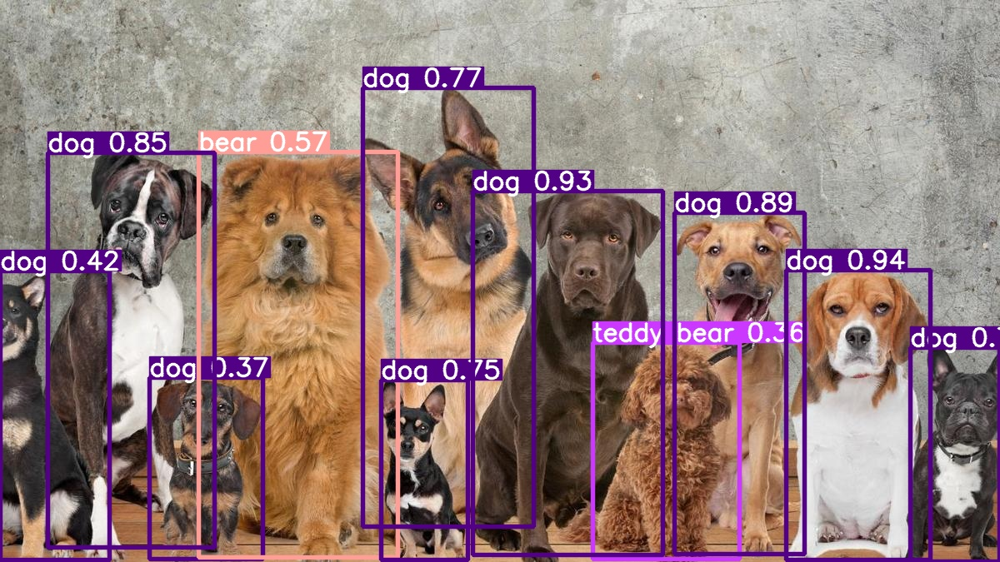

In [ ]:
%cd {HOME}
Image('/content/runs/detect/predict/66e86d63-f5d3-4752-b019-29e28f5079a5_16-9-discover-aspect-ratio_default_0.jpg', height=300)

Ahora tenemos claro que el modelo esta importado y funciona correctamente.


El siguiente paso es realizar Transfer Learning para aprovechar las capas profundas pre-entrenadas de YOLO que detectan patrones generales en imágenes como bordes, líneas, texturas, etc y realizar un entrenamiento personalizado para que las capas más profundas de la red aprendan características más complejas, en este caso se realizará este entrenamiento personalizado con un dataset de imágenes de códigos QR que se muestra a continuación:

# DataSet

El dataset que utilizaremos para entrenar el modelo de Deep Learning YOLO v8 se encuentra en el siguiente enlace: [DataSet](https://universe.roboflow.com/matej-cernohous/xcerno30-qr-codes/dataset/21)

Este dataset previamente procesado y etiquetado en [RoboFlow](https://universe.roboflow.com/) tiene la siguiente distribucion:

- Train: 2100 imágenes
- Validation: 607 imágenes
- Test: 305 Imágenes

In [5]:
# Creamos la carpeta de datasets y desacargamos los datos desde la API de RoboFlow

!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow

from roboflow import Roboflow                                             # Importamos RoboFlow

rf = Roboflow(api_key="DrxC2P2IABvkNzFcj1t1")                             # Instanciamos RoboFlow con la API privada
project = rf.workspace("matej-cernohous").project("xcerno30-qr-codes")    # Definimos de donde se desean extraer los datos
dataset = project.version(21).download("yolov8")                          # Esta linea descarga el fromato optimo para yolov8 en la version 21 del dataset


/content/datasets
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.6/57.6 kB 1.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 155.3/155.3 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.7/178.7 kB 23.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 6.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 9.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.3/59.3 kB 9.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 7.4 MB/s eta 0:00:00
  Created wheel for wget: filename=wget-3.2-py3-none-any.whl size=9655 sha256=5342e52e50ba0444cb3c2ae8771ce9a484be15dc275083ff39ea5c0515422f3d
  Stored in directory: /root/.cache/pip/wheels/8b/f1/7f/5c94f0a7a505ca1c81cd1d9208ae2064675d97582078e6c769
Successfully built wget
  Attempting uninstall: pyparsing
    Found existing installation: pyparsing 3.1.1
    Uninstalling pypar

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.134 is required but found version=8.0.20, to fix: `pip install ultralytics==8.0.134`

Extracting Dataset Version Zip to xcerno30-QR-codes-21 in yolov8:: 100%|██████████| 6100/6100 [00:01<00:00, 3301.45it/s]


# Realizamos el entrenamiento con el dataset que hemos descargado

Para este entrenamiento estableceremos como parámetros para YOLO los siguientes:
- task=detect (Establecemos la tarea del entrenamiento, será detección de objetos)
- model=yolov8s.pt (yolov8s es el segundo modelo más liviano de YOLO, para esta de experimentación y debido a la complejidad de la tarea parece ser apropiado)
- data={dataset.location}/data.yaml (Le definimos los datos de entrenamiento y validación para entrenar el modelo)
- epochs=100 (entrenaremos el modelo con 100 épocas)
- imgsz=640 (parámetro que define el tamaño de imagen para entrenar el modelo)

In [ ]:
%cd {HOME}

!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=100 imgsz=640 plots=True

/content
100% 21.5M/21.5M [00:01<00:00, 16.3MB/s]

Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
yolo/engine/trainer: task=detect, mode=train, model=yolov8s.yaml, data=/content/datasets/xcerno30-QR-codes-21/data.yaml, epochs=100, patience=50, batch=16, imgsz=640, save=True, cache=False, device=, workers=8, project=None, name=None, exist_ok=False, pretrained=False, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, image_weights=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, overlap_mask=True, mask_ratio=4, dropout=False, val=True, save_json=False, save_hybrid=False, conf=0.001, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=ultralytics/assets/, show=False, save_txt=False, save_conf=False, save_crop=False, hide_labels=False, hide_conf=False, vid_stride=1, line_thickness=3, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, boxes=True, format=torchscript, 

Cuando realizamos el entrenamiento se crea una nueva carpeta llamada Train, la cual contiene métricas de desempeño y resultados de predicciones en entrenamiento y validación, veamos el contenido de esta carpeta para extraer métricas de nuestro interés

In [ ]:
!ls {HOME}/runs/detect/train/

args.yaml					    train_batch12061.jpg
confusion_matrix.png				    train_batch12062.jpg
events.out.tfevents.1692292827.6b97b96acee3.6611.0  train_batch1.jpg
F1_curve.png					    train_batch2.jpg
P_curve.png					    val_batch0_labels.jpg
PR_curve.png					    val_batch0_pred.jpg
R_curve.png					    val_batch1_labels.jpg
results.csv					    val_batch1_pred.jpg
results.png					    val_batch2_labels.jpg
train_batch0.jpg				    val_batch2_pred.jpg
train_batch12060.jpg				    weights


Visualizamos la Matriz de confusion para comprender los resultados del modelo

/content


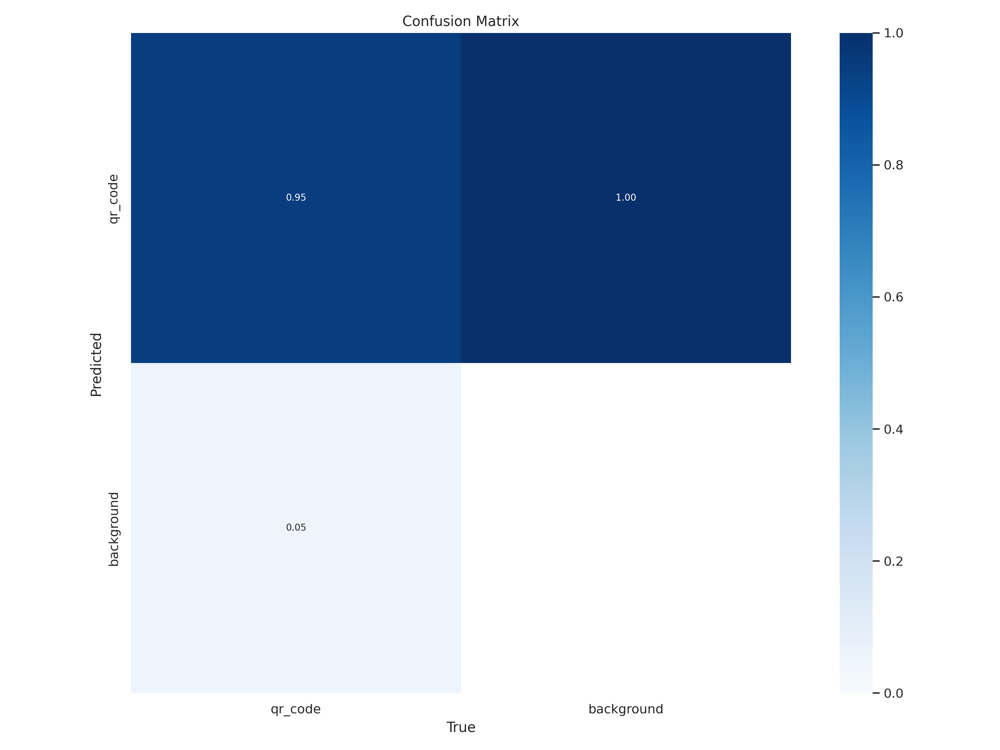

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/confusion_matrix.png', width=600)

Se observa que hay una muy alta tasa de verdaderos positivos y algo curioso que pasa con YOLO es que siempre agrega una clase llamada background asi no se encuentre definida en el .yaml, esto indica que siempre detecta el fondo al momento de hacer predicciones del código qr, al no tener definida esta clase específicamente lo detecta como un falso positivo.

En conclusión, de los códigos QR que existen se detectaron correctamente el 94% de las veces, esto es una muy buena precisión.

Vamos a comprender las curvas de entrenamiento y validación del modelo para identificar si hay posibilidad de mejorar el desempeño del modelo.

/content


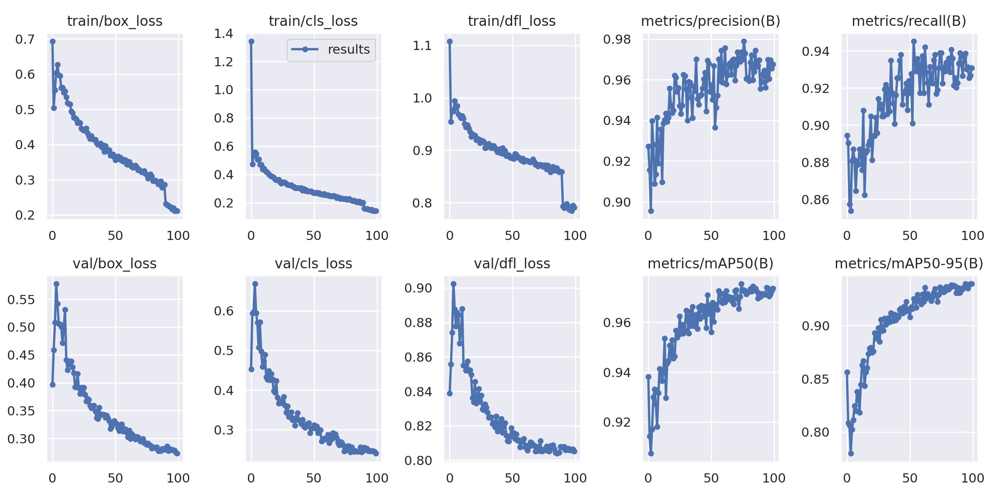

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/detect/train/results.png', width=600)

Como se observa en las gráficas anteriores el modelo mejora en cada época, lo cual indica que el modelo está aprendiendo correctamente a detectar los códigos qr y a delimitarlos con bounding boxes, sin embargo hay un salto brusco en las curvas de pérdida de los box, cls y dfl del entrenamiento, sin practicamente ningun cambio en validación, lo cual indica que aprox 80 épocas de entrenamiento son suficientes para que el modelo logre detectar el código qr de las imágenes.

# Validamos el modelo

In [ ]:
%cd {HOME}

!yolo task=detect mode=val model={HOME}/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

/content
2023-08-17 20:30:37.192104: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-17 20:30:38.067253: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/datasets/xcerno30-QR-codes-21/valid/labels.cache... 607 images, 0 backgrounds, 0 corrupt: 100% 607/607 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 38/38 [00:12<00:00,  3.08it/s]
                   all        607        967      0.966      0.927      0.973       0.94
Speed: 0.5ms pre-process, 9.1

Podemos observar que el modelo presenta unas excelentes métricas de validación, lo cual nos lleva a concluir que esta listo para hacer inferencia

# Finalmente realizamos inferencia sobre el set de test

In [ ]:
%cd {HOME}

!yolo task=detect mode=predict model={HOME}/runs/detect/train/weights/best.pt conf=0.25 source={dataset.location}/test/images save=True

/content
2023-08-17 20:34:58.616856: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-17 20:34:59.501362: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
Ultralytics YOLOv8.0.20 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11125971 parameters, 0 gradients, 28.4 GFLOPs
image 1/305 /content/datasets/xcerno30-QR-codes-21/test/images/001_jpg.rf.9bd5f235fcaf84fa6b03846fc4648c41.jpg: 640x640 1 qr_code, 16.2ms
image 2/305 /content/datasets/xcerno30-QR-codes-21/test/images/003_jpg.rf.ddd05fe95f65f5a2b4c86dd490fe0e38.jpg: 640x640 1 qr_code, 16.3ms
image 3/305 /content/datasets/xcerno30-QR-codes-21/test/images/0200_jpg.rf.6465c7f0f7ffa80a98b89b039149b4b1.jpg

Se muestran algunas imágenes resultado de la detección

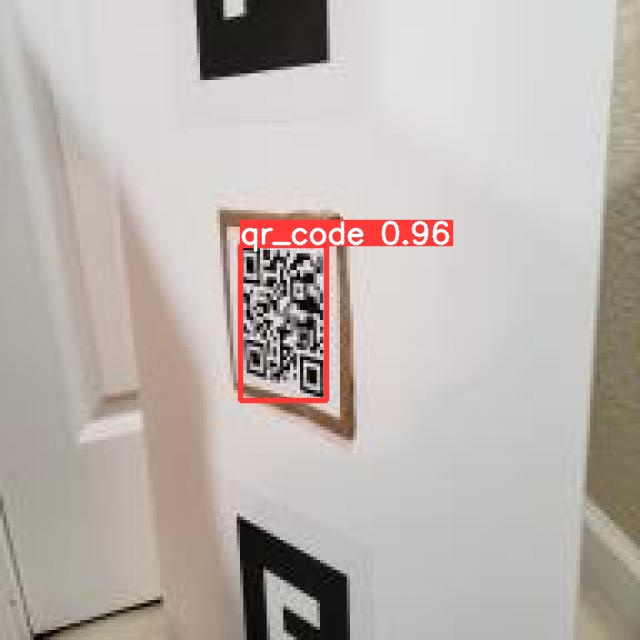

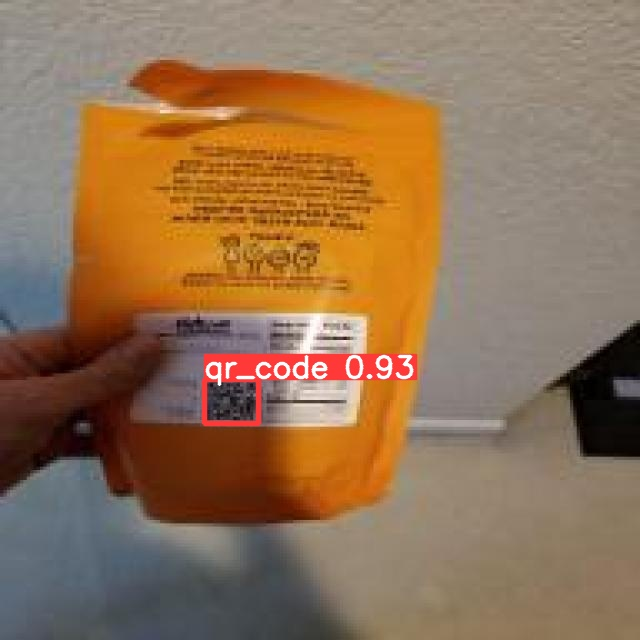

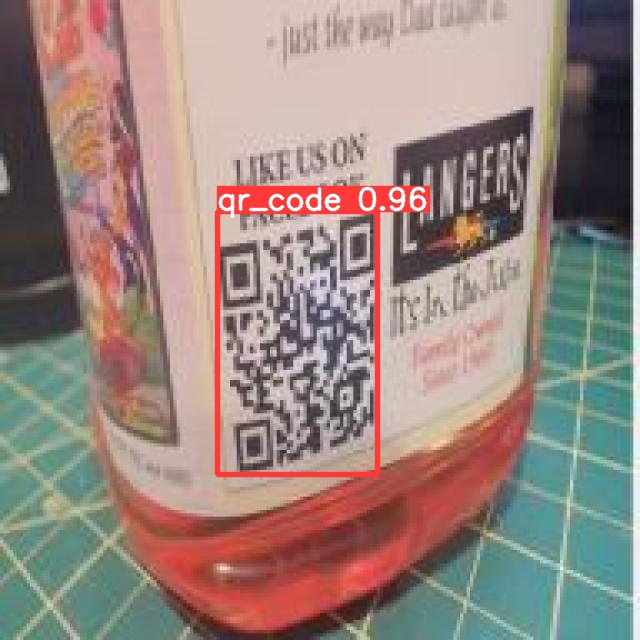

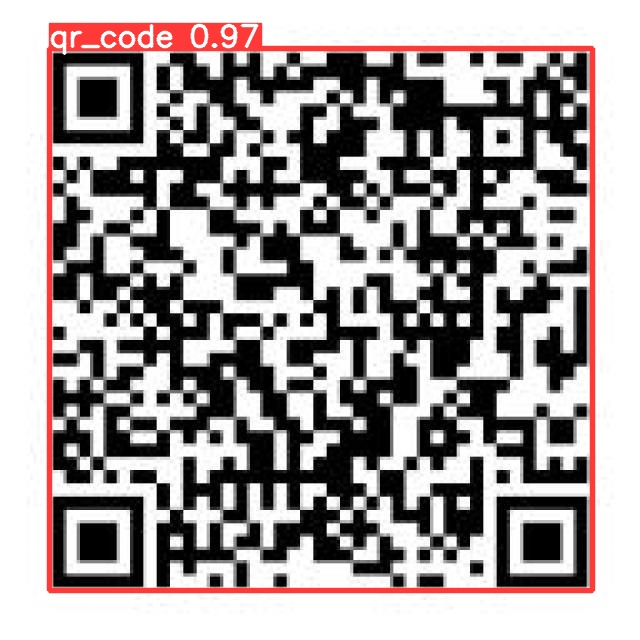

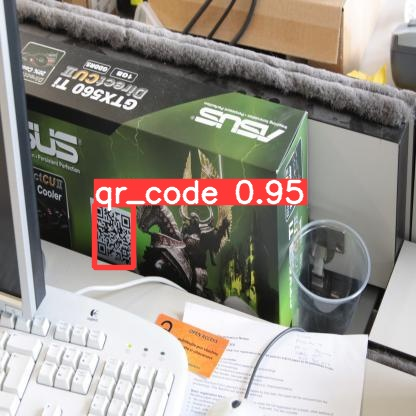

...

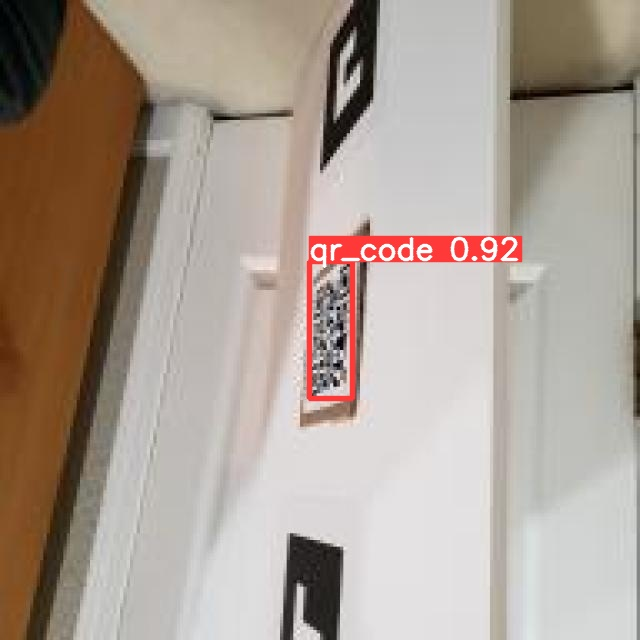

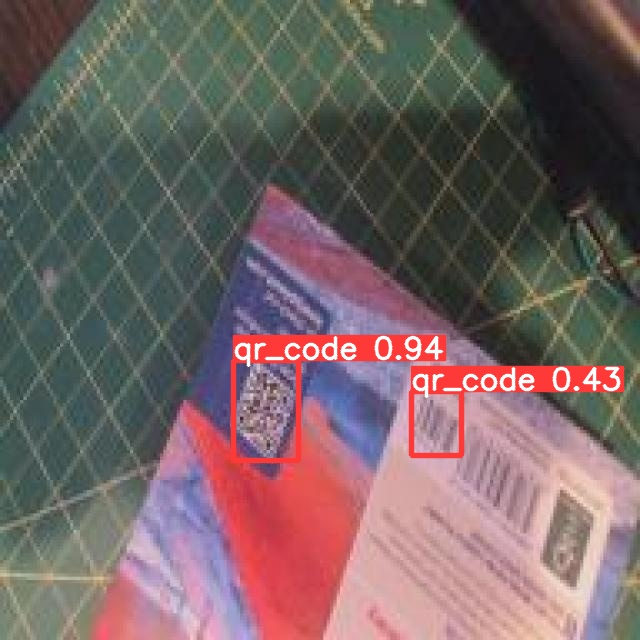

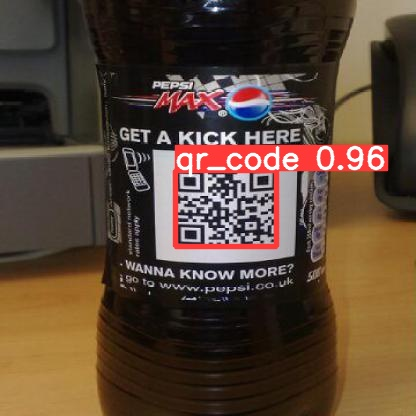

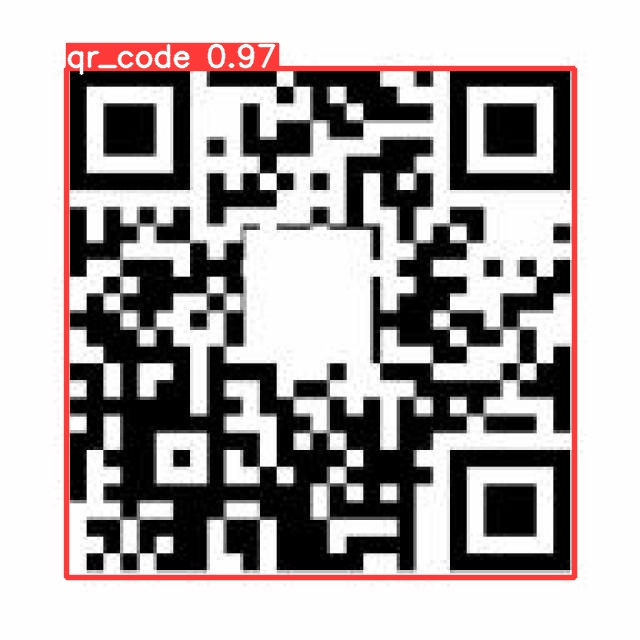

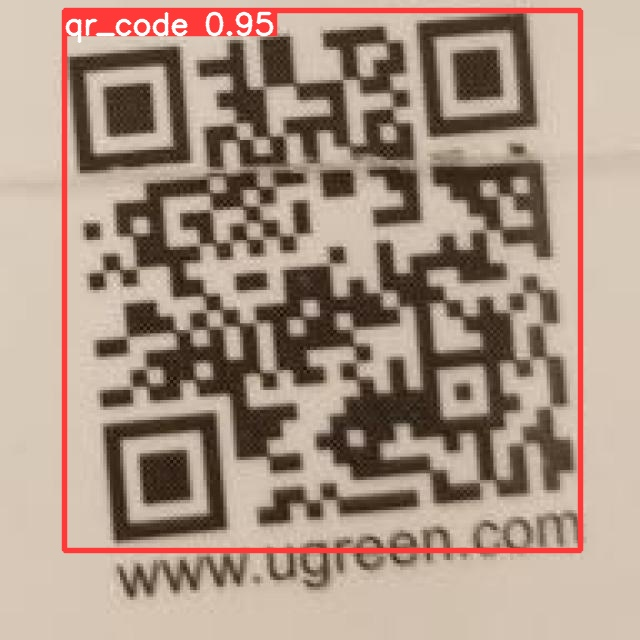

In [ ]:
import glob
from IPython.display import Image, display

for image_path in glob.glob(f'{HOME}/runs/detect/predict3/*.jpg')[:100]:
      display(Image(filename=image_path, width=600))
      print("\n")

## Todo muestra que está correcto, se descarga el modelo y se prosigue con la extracción del código QR detectado para su respectiva alineación y decodificación en el script "3. Deteccion QR.ipynb"